# Transforming and augmenting images

Understand geometry transform  
Understand color transform  
Conversion  
Auto Augmentation  

We can perform common computer vision transformations through torchvision.transforms and torchvision.transforms.v2 modules. 

## Transforms v2 

### Importing v2 libraries

In [8]:
import torch
import matplotlib.pyplot as plt
from torchvision.transforms import v2
from torchvision.io import read_image

To make the plotting and displaying result easier, we have used a plot function from the `helper` module.  
[Module_link](https://github.com/pytorch/vision/tree/main/gallery/transforms)

In [9]:
from helpers import plot

In [10]:
img = read_image('cat.jpg')
img.shape

torch.Size([3, 736, 655])

Torchvision transforms behaves similar to `torch.nn.Module`

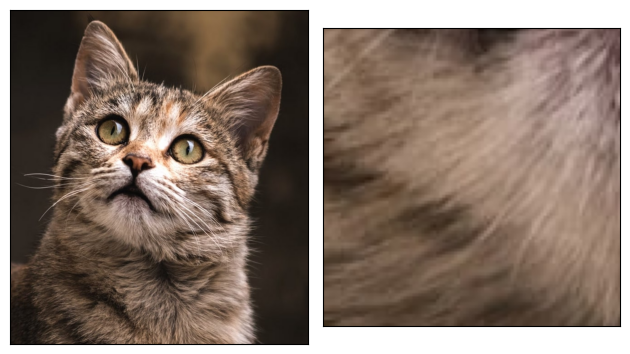

In [11]:
cropper = v2.RandomCrop(size= (100,100))
out = cropper(img)
plot([img,out])

### Creating Transform Pipeline

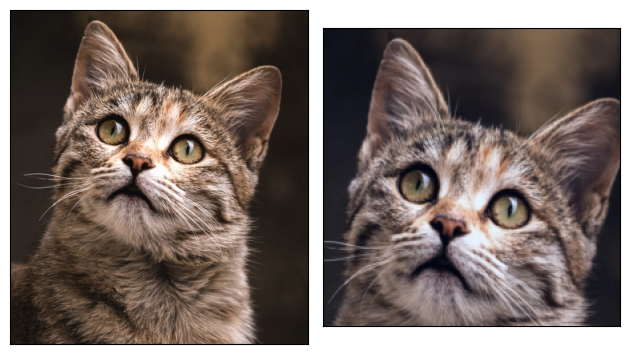

In [12]:
transforms = v2.Compose([
    v2.RandomResizedCrop(size=(224, 224), antialias=True), 
    v2.RandomHorizontalFlip(p=0.5), 
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
out = transforms(img)
plot([img,out])

Another advantage of `v2` transform is that it works on bounding boxes as well.

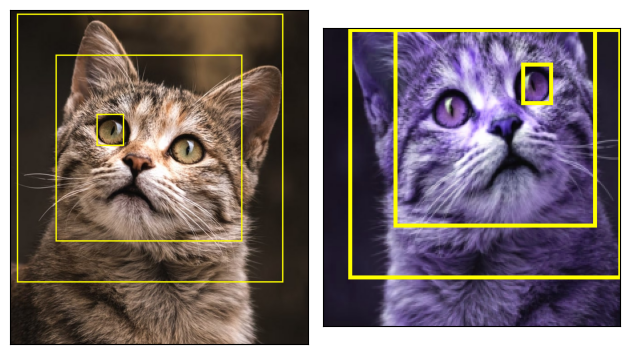

In [13]:
from torchvision import tv_tensors

boxes = tv_tensors.BoundingBoxes(
    [
        [15, 10, 600, 600],
        [100, 100, 510, 510],
        [190, 230, 250, 300]
    ],
    format="XYXY", canvas_size = img.shape[-2:])

transforms = v2.Compose([
    v2.RandomResizedCrop(size=(224, 224), antialias=True),
    v2.RandomPhotometricDistort(p=1),
    v2.RandomHorizontalFlip(p=1),
])

out_img, out_boxes = transforms(img, boxes)
plot([(img,boxes), (out_img,out_boxes) ])

We can see the v2 transoform transformed the bounding boxes as well. Similarly we can pass segmentation mask as well.

### TV Tensors

Examples of TV Tensors are `Image`, `BoundingBoxes`, `Mask` and `Video`

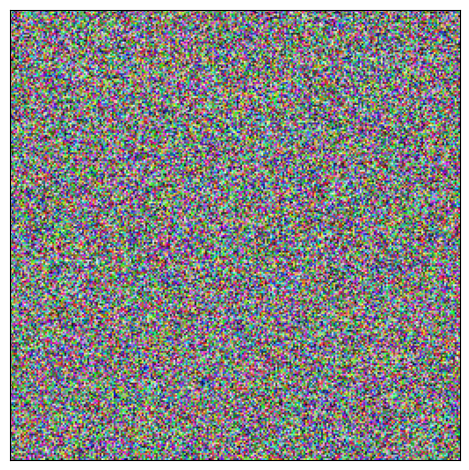

In [14]:
img_tv_tensor = tv_tensors.Image(torch.randint(0,256, size= (3,256,256), dtype= torch.uint8))
plot([img_tv_tensor])

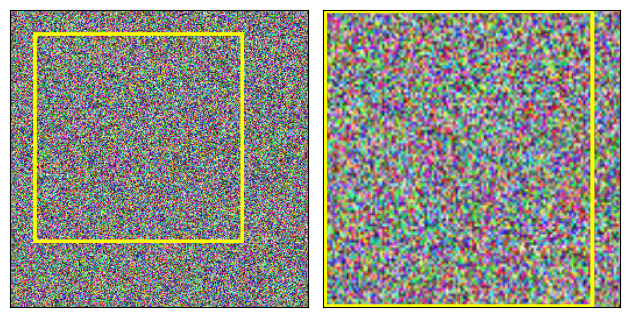

In [15]:
import random
boxes = tv_tensors.BoundingBoxes ( 
 
    [
       [20,20,200,200]  
        
    ],

    format = 'XYXY' , 
    canvas_size = img_tv_tensor.shape[-2:]
)

target = {
    "boxes" : boxes 
}

transformed_img , out_target = transforms(img_tv_tensor,target)
plot([  (img_tv_tensor,target)    ,  (transformed_img,out_target)   ])

## Geometry Transform

In [17]:
img = read_image('cat.jpg')

In [20]:
img.size()

torch.Size([3, 736, 655])

### Resizing 

Resize the input to the given size.

```python
v2.Resize(size , interpolation , max_size , antialias)
```

Parameters :

* `size `: Desired Output Size
    If the size is given like `(height,width)`, it will be matched to this sequence. 
    If the size is given `int` , aspect ratio will be maintained and the smaller edge, either height or width will be matched to this given `int`

* `interpolation` : Interpolation method for scaling
    Eg : `torchvision.transforms.InterpolationMode.BILINEAR` (which is also default), `torchvision.transforms.InterpolationMode.NEAREST` , `torchvision.transforms.InterpolationMode.BICUBIC`. 

* `max_size(int)` : max size of longer edge

* `antialias (bool)` : Apply antialiasing or not.

torch.Size([3, 22, 20])


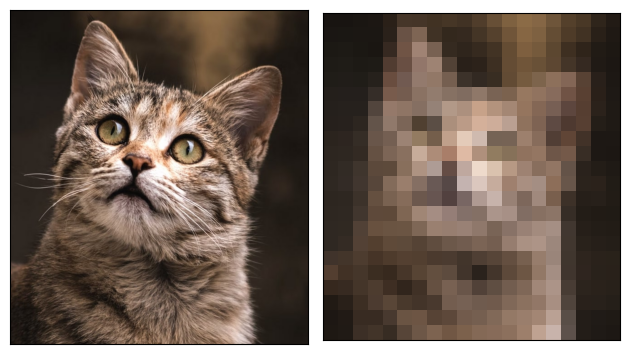

In [64]:

resizer = v2.Resize(size = 20 )
resized_img = resizer(img)
print(resized_img.shape)
plot([img,resized_img])

Thus, we can see the smaller edge 655 has been turned to 20

### ScaleJitter

Randomly jitters the scale of the input image.

```python
v2.ScaleJitter(scale_range, interpolation, antialias)
```

Parameters:
* `target_size(tuple)` : Parameter defines base scaling for jittering
* `scale_range (tuple)`: The range of scaling factors, given as `(min_scale, max_scale)`.
    The input image will be scaled by a random factor sampled from this range.

* `interpolation`: Interpolation method for scaling.
    Example: `torchvision.transforms.InterpolationMode.BILINEAR` (which is also default), `torchvision.transforms.InterpolationMode.NEAREST`, `torchvision.transforms.InterpolationMode.BICUBIC`.

* `antialias (bool)`: Apply antialiasing or not.

torch.Size([3, 11, 10])


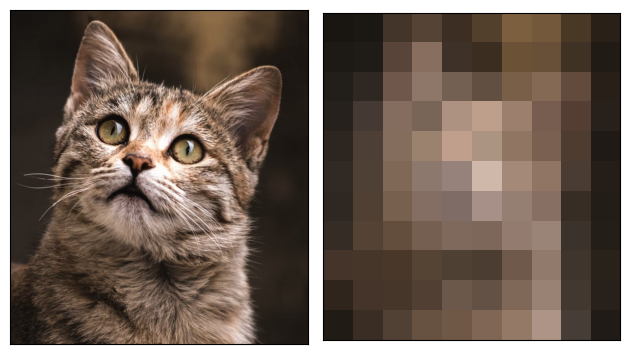

In [50]:
scale_jitter = v2.ScaleJitter(target_size = (10,20)   ,scale_range=(1, 1))
jittered_img = scale_jitter(img)
print(jittered_img.shape)
plot([img, jittered_img])

### RandomShortestSize

Randomly resizes the input image such that the shorter edge matches a randomly chosen size from the given range.

```python
v2.RandomShortestSize(min_size,max_size, interpolation, antialias)
```

Parameters:

* `min_size (list)`: The range of sizes for the shorter edge, given as `(min_size, max_size)`.
    The shorter edge of the input image will be resized to a random size from this range.

* `max_size (list)`: Maximum spatial size.

* `interpolation`: Interpolation method for scaling.
    Example: `torchvision.transforms.InterpolationMode.BILINEAR` (which is also default), `torchvision.transforms.InterpolationMode.NEAREST`, `torchvision.transforms.InterpolationMode.BICUBIC`.

* `antialias (bool)`: Apply antialiasing or not.

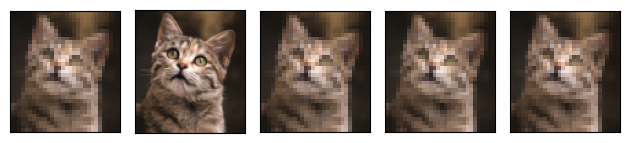

In [66]:
random_shortest_size = v2.RandomShortestSize(min_size = [20,30,85,90,400])
resized_img = [random_shortest_size(img) for i in range(5)]
plot( resized_img )

## Color

### v2.ColorJitter

Randomly change the brightness, contrast, saturation, and hue of an image or video.

```python
v2.ColorJitter(brightness=None, contrast=None, saturation=None, hue=None)
```

Parameters:

* `brightness (float or tuple of float)`: How much to jitter brightness. Should be non-negative.
* `contrast (float or tuple of float)`: How much to jitter contrast. Should be non-negative.
* `saturation (float or tuple of float)`: How much to jitter saturation. Should be non-negative.
* `hue (float or tuple of float)`: How much to jitter hue. Should be between -0.5 and 0.5.

torch.Size([3, 736, 655])


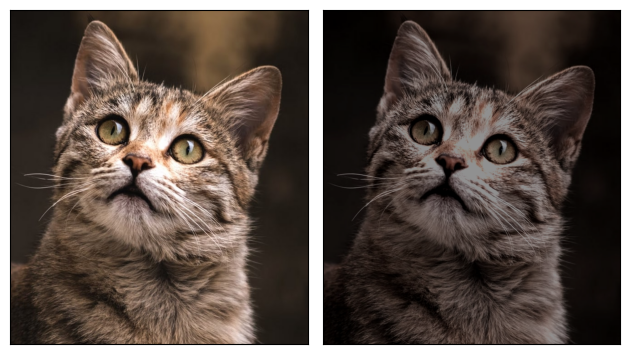

In [87]:
color_jitter = v2.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1)
jittered_img = color_jitter(img)
print(jittered_img.shape)
plot([img, jittered_img])

### v2.RandomChannelPermutation

Randomly permute the channels of an image or video.
Permutes color channels

```python
v2.RandomChannelPermutation()
```

torch.Size([3, 736, 655])


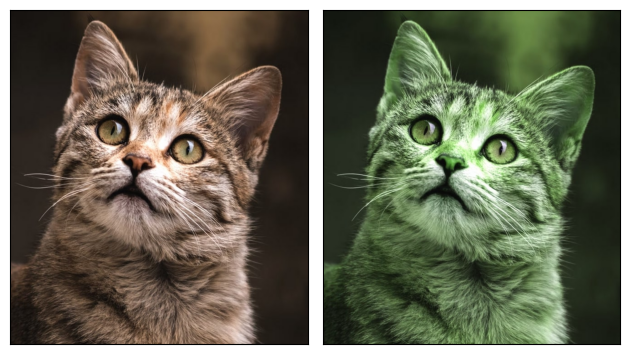

In [81]:
channel_permute = v2.RandomChannelPermutation()
permuted_img = channel_permute(img)
print(permuted_img.shape)
plot([img, permuted_img])

### v2.RandomPhotometricDistort

Randomly distorts the image or video as used in SSD: Single Shot MultiBox Detector.

```python
v2.RandomPhotometricDistort(brightness= (0.5,0.7), contrast= (0.3,0.7), saturation= (0.4,0.9), hue= (0.1,0.7))
```

This transform relies on ColorJitter under the hood to adjust the contrast, saturation, hue, brightness, and also randomly permutes channels.


Parameters:

* `brightness (tuple)`: How much to distort brightness. Should be non-negative.
* `contrast (tuple)`: How much to distort contrast. Should be non-negative.
* `saturation (tuple)`: How much to distort saturation. Should be non-negative.
* `hue (tuple)`: How much to distort hue. Should be between -0.5 and 0.5.


torch.Size([3, 736, 655])


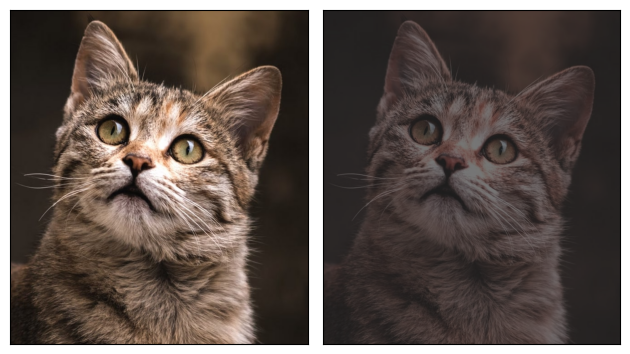

In [97]:
photometric_distort = v2.RandomPhotometricDistort(brightness= (0.5,0.7), contrast= (0.3,0.7), saturation= (0.4,0.9), hue= (0.1,0.7))
distorted_img = photometric_distort(img)
print(distorted_img.shape)
plot([img, distorted_img])

### v2.Grayscale

Convert images or videos to grayscale.

```python
v2.Grayscale(num_output_channels=1)
```

Parameters:

* `num_output_channels (int)`: Number of channels in the output image. Can be 1 or 3.

torch.Size([3, 736, 655])


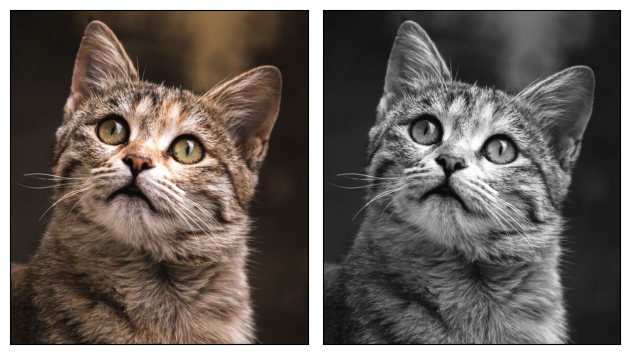

In [102]:
grayscale = v2.Grayscale(num_output_channels=3)
gray_img = grayscale(img)
print(gray_img.shape)
plot([img, gray_img])

### v2.RGB

Convert images or videos to RGB (if they are already not RGB).

```python
v2.RGB()
```

torch.Size([3, 736, 655])


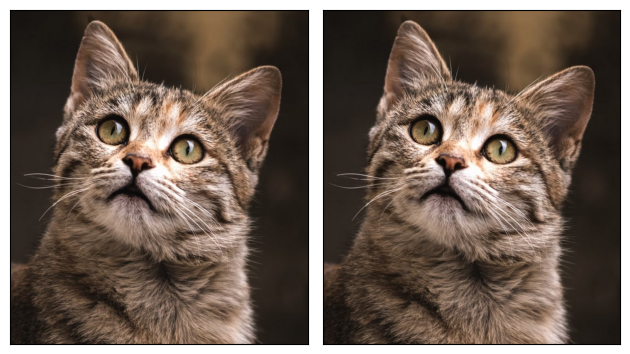

In [71]:
rgb = v2.RGB()
rgb_img = rgb(img)
print(rgb_img.shape)
plot([img, rgb_img])

### v2.RandomGrayscale

Randomly convert image or videos to grayscale with a probability of p (default 0.1).

```python
v2.RandomGrayscale(p=0.1)
```

Parameters:

* `p (float)`: Probability of the image being converted to grayscale.

torch.Size([3, 736, 655])


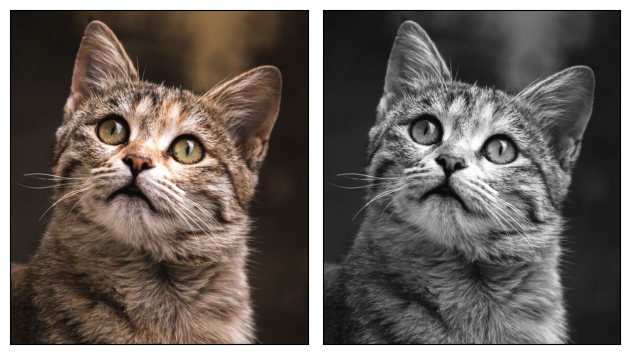

In [107]:
random_grayscale = v2.RandomGrayscale(p=0.3)
gray_img = random_grayscale(img)
print(gray_img.shape)
plot([img, gray_img])

### v2.GaussianBlur

Blurs image with randomly chosen Gaussian blur kernel.

```python
v2.GaussianBlur(kernel_size, sigma=(0.1, 2.0))
```

Parameters:

* `kernel_size (int or tuple)`: Size of the Gaussian kernel.
* `sigma (tuple of float)`: Standard deviation of the Gaussian kernel.

torch.Size([3, 736, 655])


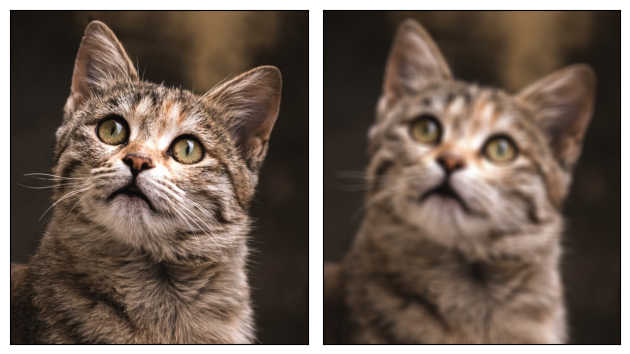

In [124]:
gaussian_blur = v2.GaussianBlur(kernel_size= 15, sigma=(10, 20))
blurred_img = gaussian_blur(img)
print(blurred_img.shape)
plot([img, blurred_img])

### v2.RandomInvert

Inverts the colors of the given image or video with a given probability.

```python
v2.RandomInvert(p=0.5)
```

Parameters:

* `p (float)`: Probability of the image being inverted.

torch.Size([3, 736, 655])


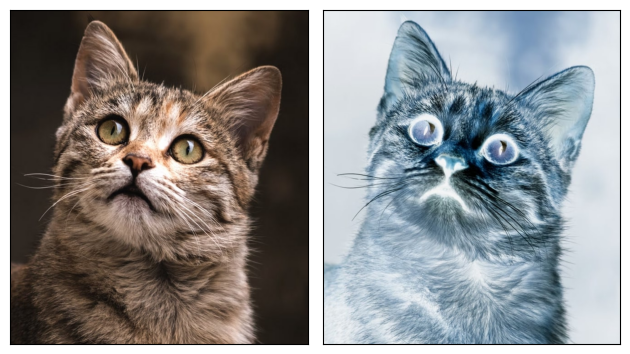

In [133]:
random_invert = v2.RandomInvert(p=0.9)
inverted_img = random_invert(img)
print(inverted_img.shape)
plot([img, inverted_img])

### v2.RandomPosterize

Posterize the image or video with a given probability by reducing the number of bits for each color channel.

```python
v2.RandomPosterize(bits, p=0.5)
```
Parameters:

* `bits (int)`: Number of bits to keep for each channel (1-8).
* `p (float)`: Probability of the image being posterized.


torch.Size([3, 736, 655])


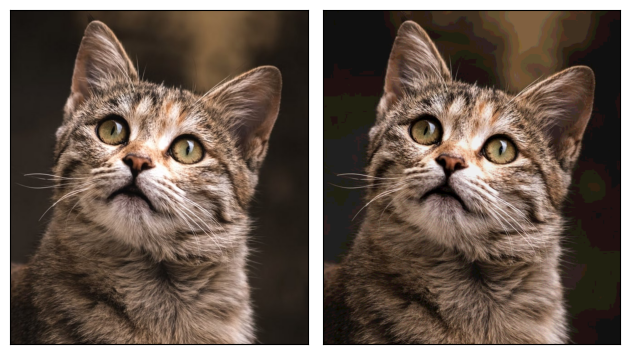

In [137]:
random_posterize = v2.RandomPosterize(bits=4, p=0.8)
posterized_img = random_posterize(img)
print(posterized_img.shape)
plot([img, posterized_img])

### v2.RandomSolarize

Solarize the image or video with a given probability by inverting all pixel values above a threshold.

```python
v2.RandomSolarize(threshold, p=0.5)
```

Parameters:

* `threshold (float)`: All pixels above this value are inverted.
* `p (float)`: Probability of the image being solarized.

torch.Size([3, 736, 655])


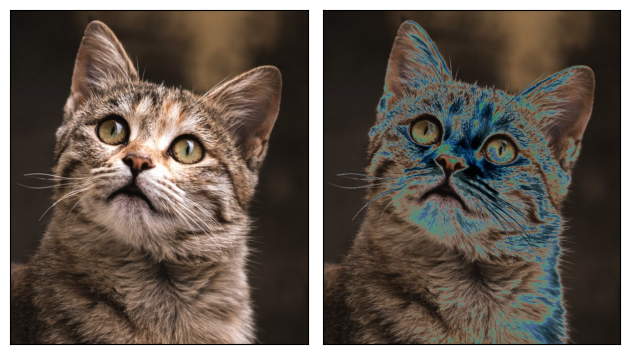

In [142]:
random_solarize = v2.RandomSolarize(threshold= 150, p=0.9)
solarized_img = random_solarize(img)
print(solarized_img.shape)
plot([img, solarized_img])


### v2.RandomAdjustSharpness

Adjust the sharpness of the image or video with a given probability.

```python
v2.RandomAdjustSharpness(sharpness_factor, p=0.5)
```

Parameters:

* `sharpness_factor (float)`: Factor by which to adjust the sharpness. Values > 1 make the image sharper, values < 1 make the image blurrier.
* `p (float)`: Probability of the image sharpness being adjusted.

torch.Size([3, 736, 655])


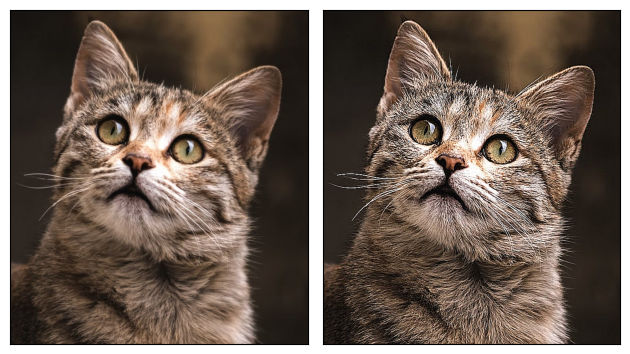

In [156]:
random_sharpness = v2.RandomAdjustSharpness(sharpness_factor= 10, p=0.9)
sharpened_img = random_sharpness(img)
print(sharpened_img.shape)
plot([img, sharpened_img])

### v2.RandomAutocontrast

Autocontrast the pixels of the given image or video with a given probability.

```python
v2.RandomAutocontrast(p=0.5)
```

Parameters:

* `p (float)`: Probability of the image being autocontrasted.

torch.Size([3, 736, 655])


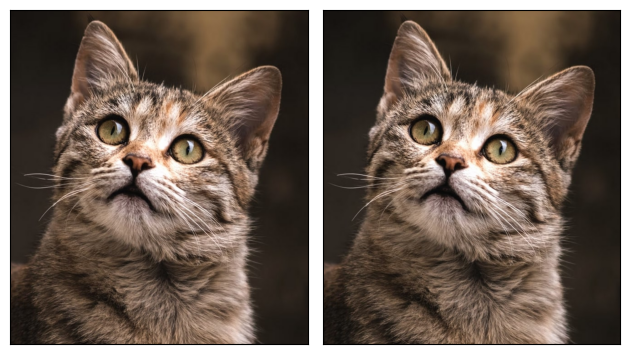

In [147]:
random_autocontrast = v2.RandomAutocontrast(p=0.9)
autocontrasted_img = random_autocontrast(img)
print(autocontrasted_img.shape)
plot([img, autocontrasted_img])

### v2.RandomEqualize

Equalize the histogram of the given image or video with a given probability.

```python
v2.RandomEqualize(p=0.5)
```

Parameters:

* `p (float)`: Probability of the image being equalized.

torch.Size([3, 736, 655])


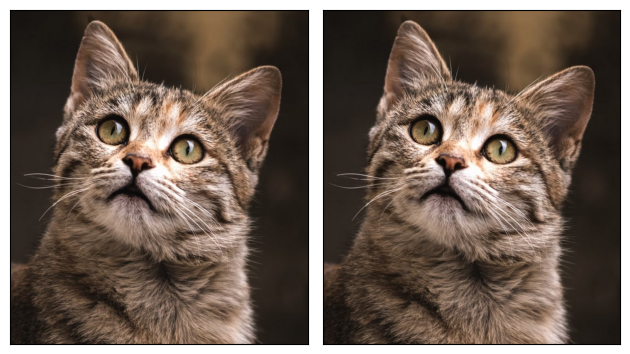

In [79]:
random_equalize = v2.RandomEqualize(p=0.5)
equalized_img = random_equalize(img)
print(equalized_img.shape)
plot([img, equalized_img])

## Composition

### v2.Compose

Composes several transforms together.

```python
v2.Compose(transforms)
```

Parameters:

* `transforms (list)`: A list of transformations to be applied sequentially.

torch.Size([3, 256, 256])


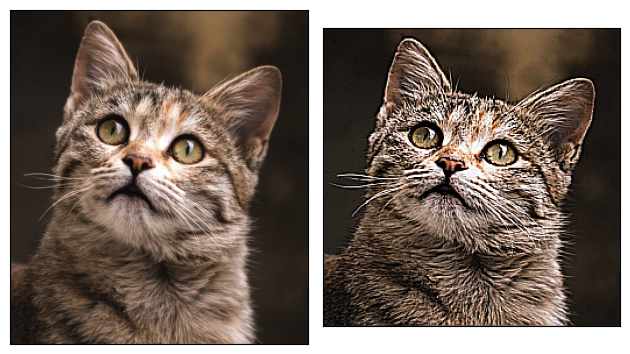

In [165]:
compose = v2.Compose([v2.Resize((256, 256)), v2.ColorJitter(brightness=0.5) , v2.RandomAdjustSharpness(sharpness_factor= 10, p=0.9) ])
transformed_img = compose(img)
print(transformed_img.shape)
plot([img, transformed_img])

### v2.RandomApply

Apply randomly a list of transformations with a given probability.

```python
v2.RandomApply(transforms, p=0.5)
```

Parameters:

* `transforms (list)`: A list of transformations to be applied.
* `p (float)`: Probability of applying the list of transformations. Default is 0.5.


torch.Size([3, 256, 256])


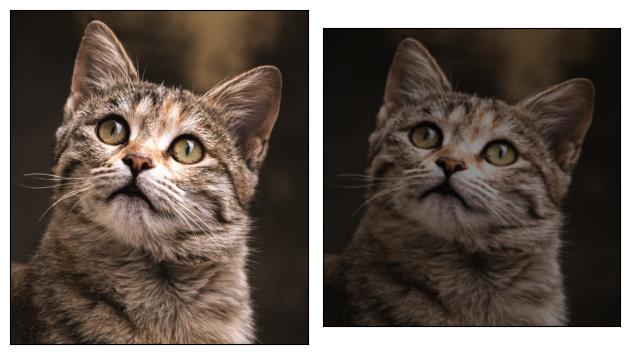

In [171]:
random_apply = v2.RandomApply([v2.Resize((256, 256)), v2.ColorJitter(brightness=0.5) , v2.RandomAdjustSharpness(sharpness_factor= 10, p=0.9) ], p=0.5)
transformed_img = random_apply(img)
print(transformed_img.shape)
plot([img, transformed_img])

### v2.RandomChoice

Apply a single transformation randomly picked from a list.

```python
v2.RandomChoice(transforms)
```

Parameters:

* `transforms (list)`: A list of transformations to choose from.

torch.Size([3, 736, 655])


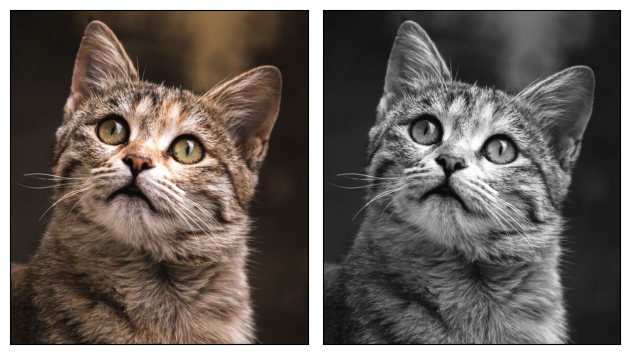

In [176]:
random_choice = v2.RandomChoice([v2.Resize((256, 256)), v2.Grayscale(num_output_channels=3)])
transformed_img = random_choice(img)
print(transformed_img.shape)
plot([img, transformed_img])

### v2.RandomOrder

Apply a list of transformations in a random order.

```python
v2.RandomOrder(transforms)
```

Parameters:

* `transforms (list)`: A list of transformations to be applied in random order.

torch.Size([3, 256, 256])


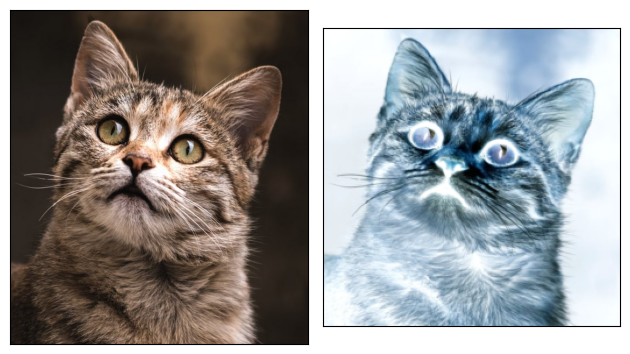

In [178]:
random_order = v2.RandomOrder([v2.ColorJitter(brightness=0.5), v2.Resize((256, 256)), v2.RandomInvert(p = 0.9)  ])
transformed_img = random_order(img)
print(transformed_img.shape)
plot([img, transformed_img])

## Conversion

### v2.ToImage

Convert a tensor, ndarray, or PIL Image to Image; this does not scale values.

```python
v2.ToImage()
```

<class 'torchvision.tv_tensors._image.Image'>


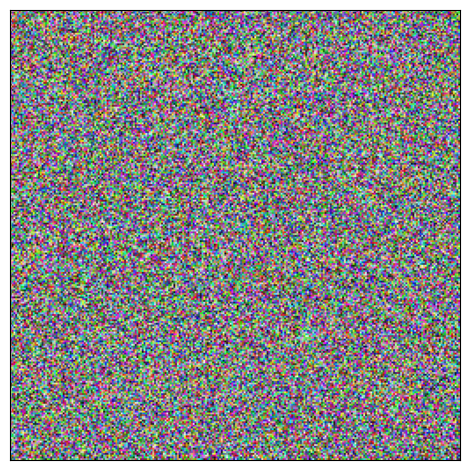

In [179]:
to_image = v2.ToImage()
random_tensor =  torch.randint(0,256, size= (3,256,256), dtype= torch.uint8)
image = to_image(random_tensor)
print(type(image))
plot([image])

### v2.ToPureTensor

Convert all TVTensors to pure tensors, removing associated metadata (if any).

```python
v2.ToPureTensor()
```


### v2.PILToTensor

Convert a PIL Image to a tensor of the same type - this does not scale values.

```python
v2.PILToTensor()
```

In [181]:
import PIL.Image

pil_to_tensor = v2.PILToTensor()
pil_image = PIL.Image.open('cat.jpg')
tensor = pil_to_tensor(pil_image)
print(type(tensor))

<class 'torch.Tensor'>


### v2.ToDtype

Converts the input to a specific dtype, optionally scaling the values for images or videos.

```python
v2.ToDtype(dtype, scale=True)
```

Parameters:

* `dtype (torch.dtype)`: The desired data type of the output.
* `scale (bool)`: If True, scales the values when converting (e.g., [0, 255] to [0, 1] for uint8 to float32).


In [184]:
random_tensor =  torch.randint(0,255, size= (255,255), dtype= torch.uint8)
to_dtype = v2.ToDtype(dtype=torch.float32, scale=True)
scaled_tensor = to_dtype(random_tensor)
print(scaled_tensor.dtype)

torch.float32


### v2.ConvertBoundingBoxFormat

Convert bounding box coordinates to the given format, e.g., from "CXCYWH" to "XYXY".

```python
v2.ConvertBoundingBoxFormat(format)
```

Parameters:

* `format (str)`: The target format for bounding box coordinates. Examples include "CXCYWH" (center x, center y, width, height) and "XYXY" (xmin, ymin, xmax, ymax).


## Auto-Augmentation

AutoAugment is a common data augmentation technique that can improve the accuracy of image classification models. Though the data augmentation policies are directly linked to their trained dataset, empirical studies show that ImageNet policies provide significant improvements when applied to other datasets. In TorchVision, we implemented 3 policies learned on the following datasets: ImageNet, CIFAR10, and SVHN. The new transform can be used standalone or mixed-and-matched with existing transforms:

### v2.AutoAugment


```python
v2.AutoAugment(policy =  torchvision.transforms.autoaugment.AutoAugmentPolicy.IMAGENET   , interpolation= torchvision.transforms.InterpolationMode.NEAREST, fill=None)
```

Parameters:

* `policy (AutoAugmentPolicy) `: The policy to use for AutoAugment. Options are 'imagenet', 'cifar10', and 'svhn'.
* `interpolation (InterpolationMode)`: The interpolation method for resizing operations (default is NEAREST).
* `fill (sequence or int)`: Optional fill color for padding operations.


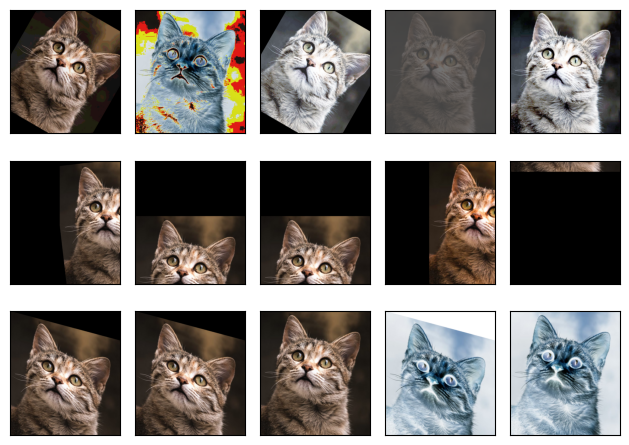

In [193]:
from torchvision.transforms.v2 import AutoAugmentPolicy


auto_augment1 = v2.AutoAugment(policy = AutoAugmentPolicy.IMAGENET )
auto_augment2 = v2.AutoAugment(policy = AutoAugmentPolicy.CIFAR10 )
auto_augment3 = v2.AutoAugment(policy = AutoAugmentPolicy.SVHN )

augmented_img1 = [auto_augment1(img) for i in range(5)]
augmented_img2 = [auto_augment2(img) for i in range(5)]
augmented_img3 = [auto_augment3(img) for i in range(5)]


plot([ augmented_img1 , augmented_img2 ,augmented_img3          ])

### v2.RandAugment

The RandAugment is an alternate version of AutoAugment.

```python
v2.RandAugment(num_ops=2, magnitude=9, interpolation= v2.InterpolationMode.NEAREST, fill=None)
```

Parameters:

* `num_ops (int)`: Number of augmentation transformations to apply.
* `magnitude (int)`: Magnitude for all the transformations.
* `interpolation (InterpolationMode)`: The interpolation method for resizing operations (default is NEAREST).
* `fill (sequence or int)`: Optional fill color for padding operations.


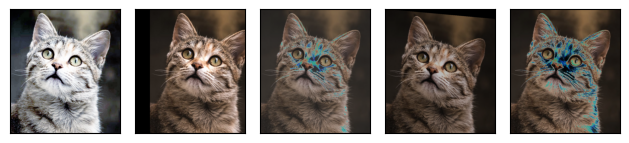

In [197]:
rand_augment = v2.RandAugment(num_ops=2, magnitude=9)
rand_augmented_img = [rand_augment(img) for i in range(5)]
plot(rand_augmented_img)

#### v2.TrivialAugmentWide

Dataset-independent data-augmentation with TrivialAugment Wide, as described in "TrivialAugment: Tuning-free Yet State-of-the-Art Data Augmentation".

```python
v2.TrivialAugmentWide(num_magnitude_bins=31, interpolation=T.InterpolationMode.NEAREST, fill=None)
```

Parameters:

* `num_magnitude_bins (int)`: Number of different magnitude values.
* `interpolation (InterpolationMode)`: The interpolation method for resizing operations (default is NEAREST).
* `fill (sequence or int)`: Optional fill color for padding operations.

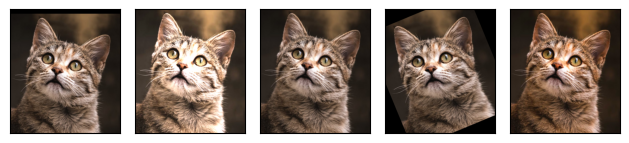

In [203]:
trivial_augment = v2.TrivialAugmentWide(num_magnitude_bins=31)
augmented_img = [trivial_augment(img) for i in range(5)]
plot(augmented_img)

### v2.AugMix

AugMix data augmentation method based on "AugMix: A Simple Data Processing Method to Improve Robustness and Uncertainty".

```python
v2.AugMix(severity=3, mixture_width=3, mixture_depth=-1, interpolation=T.InterpolationMode.NEAREST, fill=None)
```

Parameters:

* `severity (int)`: Severity of underlying augmentation operators (default is 3).
* `mixture_width (int)`: Width of augmentation chains (default is 3).
* `mixture_depth (int)`: Depth of augmentation chains (default is -1, which means a random depth).
* `interpolation (InterpolationMode)`: The interpolation method for resizing operations (default is NEAREST).
* `fill (sequence or int)`: Optional fill color for padding operations.


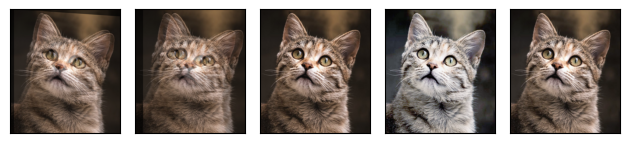

In [208]:
augmix = v2.AugMix(severity=3, mixture_width=3)
augmented_img = [augmix(img) for i in range(5)]
plot(augmented_img)